<a href="https://colab.research.google.com/github/vaibhav2903/deepfakeDetection/blob/main/LIME.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import f1_score, precision_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
drive.mount('/content/drive/')
file_path_X = '/content/drive/MyDrive/X_data.npy'
np_data_X = np.load(file_path_X)

Mounted at /content/drive/


In [ ]:
import numpy as np
file_path_Y = '/content/drive/MyDrive/Y_data.npy'
np_data_Y = np.load(file_path_Y)

In [ ]:
np_data_Y[9671]

1

array([[[34, 50, 63],
        [33, 49, 62],
        [37, 50, 64],
        ...,
        [25, 31, 37],
        [26, 32, 36],
        [31, 36, 39]],

       [[33, 49, 62],
        [32, 48, 61],
        [36, 52, 64],
        ...,
        [25, 33, 39],
        [27, 33, 38],
        [30, 36, 41]],

       [[33, 49, 62],
        [31, 47, 60],
        [34, 50, 62],
        ...,
        [27, 35, 42],
        [27, 35, 42],
        [30, 36, 43]],

       ...,

       [[38, 51, 73],
        [37, 50, 72],
        [39, 52, 74],
        ...,
        [34, 49, 66],
        [37, 51, 67],
        [40, 53, 69]],

       [[35, 48, 70],
        [34, 47, 69],
        [37, 51, 72],
        ...,
        [35, 50, 67],
        [35, 50, 66],
        [38, 51, 67]],

       [[34, 47, 69],
        [34, 47, 69],
        [38, 51, 73],
        ...,
        [34, 49, 66],
        [35, 50, 66],
        [38, 51, 67]]], dtype=uint8)
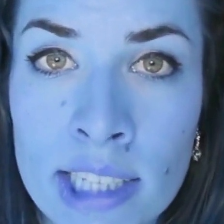

In [ ]:
np_data_X[6999]

array([[[55, 66, 76],
        [54, 66, 78],
        [54, 68, 80],
        ...,
        [36, 49, 65],
        [31, 44, 60],
        [29, 42, 56]],

       [[52, 64, 74],
        [52, 64, 76],
        [52, 66, 78],
        ...,
        [33, 47, 63],
        [31, 43, 57],
        [28, 41, 55]],

       [[52, 64, 76],
        [51, 65, 76],
        [52, 65, 79],
        ...,
        [32, 48, 63],
        [30, 45, 58],
        [29, 42, 56]],

       ...,

       [[33, 48, 67],
        [33, 48, 67],
        [33, 47, 69],
        ...,
        [47, 58, 78],
        [43, 54, 74],
        [41, 52, 72]],

       [[33, 48, 67],
        [32, 47, 66],
        [31, 45, 68],
        ...,
        [44, 55, 75],
        [40, 51, 71],
        [39, 48, 68]],

       [[33, 48, 67],
        [31, 46, 65],
        [31, 45, 67],
        ...,
        [43, 51, 71],
        [38, 47, 67],
        [38, 47, 67]]], dtype=uint8)
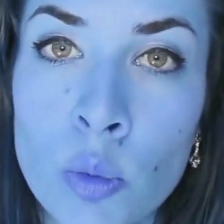

In [ ]:
np_data_X[6998]

array([[[79, 73, 72],
        [73, 70, 70],
        [61, 63, 66],
        ...,
        [30, 41, 55],
        [31, 40, 54],
        [30, 39, 53]],

       [[79, 73, 75],
        [73, 71, 72],
        [62, 64, 68],
        ...,
        [31, 40, 54],
        [29, 38, 52],
        [27, 36, 50]],

       [[79, 75, 77],
        [71, 71, 74],
        [62, 65, 70],
        ...,
        [31, 41, 55],
        [31, 38, 52],
        [29, 37, 50]],

       ...,

       [[35, 49, 71],
        [31, 48, 69],
        [28, 47, 68],
        ...,
        [31, 55, 73],
        [37, 59, 77],
        [36, 55, 76]],

       [[35, 49, 68],
        [31, 47, 66],
        [28, 47, 65],
        ...,
        [33, 57, 76],
        [37, 58, 79],
        [35, 54, 75]],

       [[34, 47, 65],
        [32, 47, 64],
        [30, 50, 66],
        ...,
        [30, 54, 74],
        [33, 54, 75],
        [30, 51, 73]]], dtype=uint8)
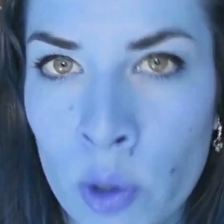

In [ ]:
np_data_X[6996]

In [ ]:
features_test = np_data_X[7001:13000]
labels_test = np_data_Y[7001:13000]

In [ ]:
# from sklearn.model_selection import train_test_split

# # Split the data into training and testing sets
# features_train, features_test, labels_train, labels_test = train_test_split(np_data_X, np_data_Y, test_size=0.2, random_state=42)

In [ ]:
import keras
model = keras.models.load_model('/content/drive/MyDrive/my_cnn_model1.h5')

In [ ]:
pip install visualkeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 7.8 MB/s eta 0:00:00


In [ ]:
import visualkeras

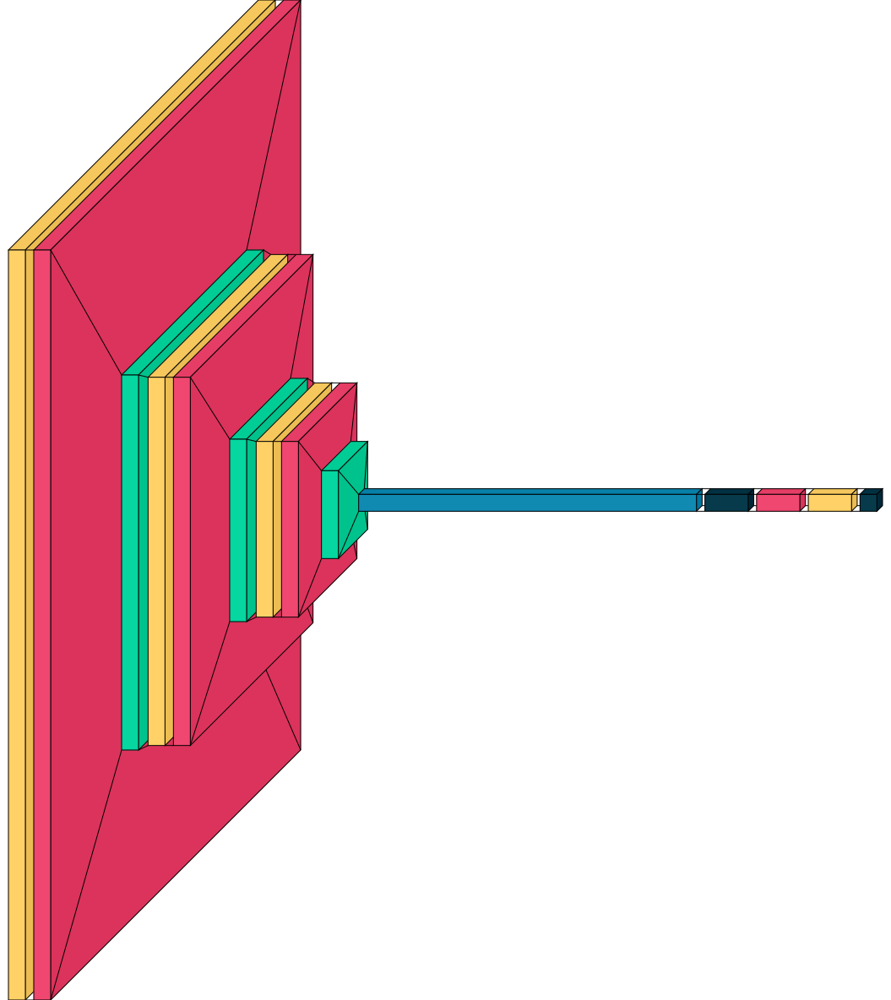

In [ ]:
visualkeras.layered_view(model).show() # display using your system viewer
visualkeras.layered_view(model, to_file='output.png') # write to disk
visualkeras.layered_view(model, to_file='output.png').show() # write and show

visualkeras.layered_view(model)

In [ ]:
predictions_prob = model.predict(features_test)
predictions = (predictions_prob > 0.5).astype("int32")

188/188 [==============================] - 287s 2s/step


In [ ]:
f1 = f1_score(labels_test, predictions)
precision = precision_score(labels_test, predictions)

print(f"F1 Score: {f1}")
print(f"Precision: {precision}")

F1 Score: 0.8545764286820504
Precision: 0.8857142857142857


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=ce720926b1cff04ee45483038bbd57f71bac1f6ff7a2defc29d27d7c2b252deb
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
from lime.wrappers.scikit_image import SegmentationAlgorithm

# Function to generate textual explanation using LIME
def generate_textual_explanation(img_array, model, explainer, num_samples=1000, num_features=10, hide_color=0,
                                  segmentation_method='quickshift', **segmentation_params):
    # Define a segmentation algorithm based on the method and parameters provided
    segmentation_fn = SegmentationAlgorithm(segmentation_method, **segmentation_params)

    # Generate the explanation for the instance
    explanation_instance = explainer.explain_instance(
        img_array,
        classifier_fn=model.predict,
        top_labels=1,
        hide_color=hide_color,
        num_samples=num_samples,
        segmentation_fn=segmentation_fn
    )

    # Get the image and mask of the explanation
    image, mask = explanation_instance.get_image_and_mask(
        explanation_instance.top_labels[0],
        positive_only=False,
        num_features=num_features,
        hide_rest=False
    )

    return image, mask

array([[[25, 18, 39],
        [25, 18, 39],
        [25, 18, 39],
        ...,
        [ 5,  1, 12],
        [ 5,  1, 12],
        [ 5,  1, 12]],

       [[24, 17, 38],
        [24, 17, 38],
        [25, 18, 39],
        ...,
        [ 4,  1, 11],
        [ 4,  1, 11],
        [ 4,  1, 11]],

       [[23, 16, 37],
        [23, 16, 37],
        [24, 17, 38],
        ...,
        [ 3,  0, 10],
        [ 3,  0, 10],
        [ 3,  0, 10]],

       ...,

       [[27, 22, 37],
        [27, 22, 37],
        [27, 22, 37],
        ...,
        [ 4,  0, 12],
        [ 4,  0, 12],
        [ 4,  0, 12]],

       [[29, 24, 39],
        [29, 24, 39],
        [29, 24, 39],
        ...,
        [ 4,  0, 11],
        [ 4,  0, 11],
        [ 4,  0, 11]],

       [[30, 25, 40],
        [30, 25, 40],
        [30, 25, 40],
        ...,
        [ 4,  0, 11],
        [ 4,  0, 11],
        [ 4,  0, 11]]], dtype=uint8)
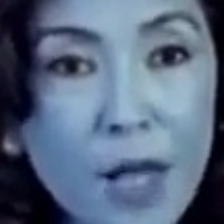

In [ ]:
features_test[200]

In [ ]:
labels_test[2000]

0

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[2000], model, explainer, segmentation_fn=segmentation_fn)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 404ms/step


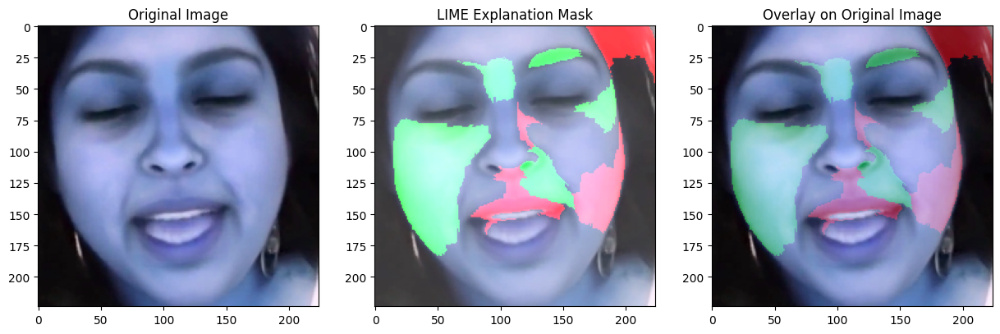

In [ ]:
# Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[2000])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[0], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[2000])
plt.imshow(explanation_text[0], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

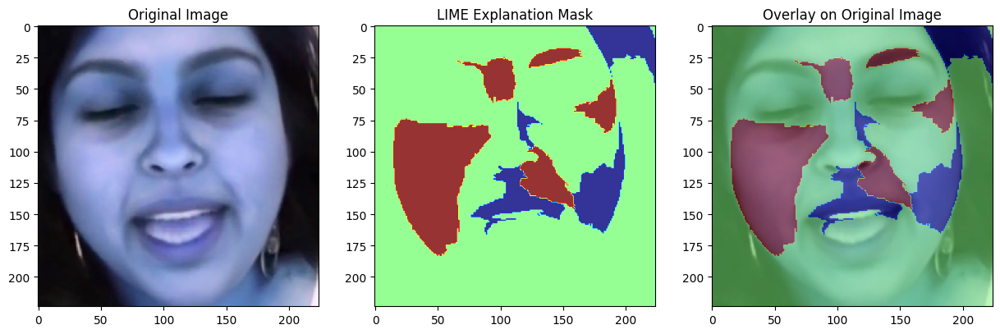

In [ ]:
# Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[2000])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[2000])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

# print(f"Predicted class: {predicted_class_label}")

In [ ]:
labels_test[2000]

1

In [ ]:
predictions[2000]

array([1], dtype=int32)

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[131], model, explainer, segmentation_fn=segmentation_fn)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 398ms/step


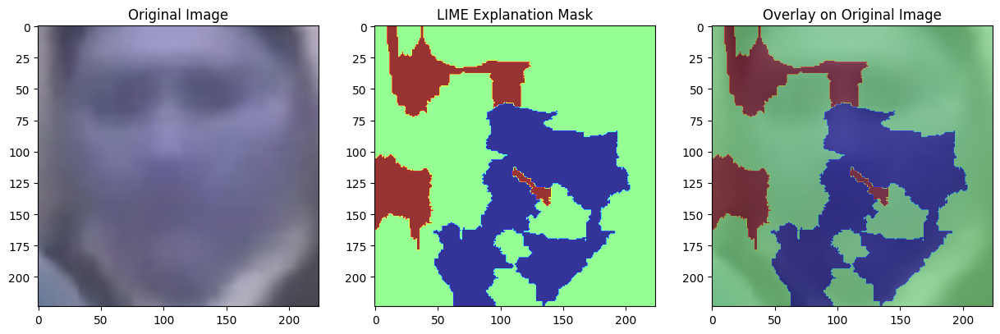

In [ ]:
# Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[131])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[131])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

In [ ]:
predictions_prob = model.predict(features_test)
predictions = (predictions_prob > 0.5).astype("int32")

  3/121 [..............................] - ETA: 6:22

KeyboardInterrupt: 

In [ ]:
predictions

array([[1],
       [1],
       [0],
       ...,
       [0],
       [0],
       [0]], dtype=int32)

In [ ]:
predicted_classes = np.argmax(predictions, axis=1)

In [ ]:
cm = confusion_matrix(labels_test, predictions)

In [ ]:
cm

array([[1824,  141],
       [  80, 1812]])

In [ ]:
cm1 = confusion_matrix(labels_test, predicted_classes)
cm1

array([[1965,    0],
       [1892,    0]])

In [ ]:
labels_test[1]

1

In [ ]:
len(labels_test)

3857

In [ ]:
misclassified_output = []

for i in range(len(labels_test)):
  if labels_test[i]!=predictions[i][0] and labels_test[i]==1 and predictions[i][0]==0:
      # print(labels_test[i])
      # print(predicted_classes[i])
      misclassified_output.append(i)

In [ ]:
misclassified_output

In [ ]:
misclassified_output1 = []

for i in range(len(labels_test)):
  if labels_test[i]!=predictions[i][0] and labels_test[i]==0 and predictions[i][0]==1:
      misclassified_output1.append(i)

In [ ]:
features_test

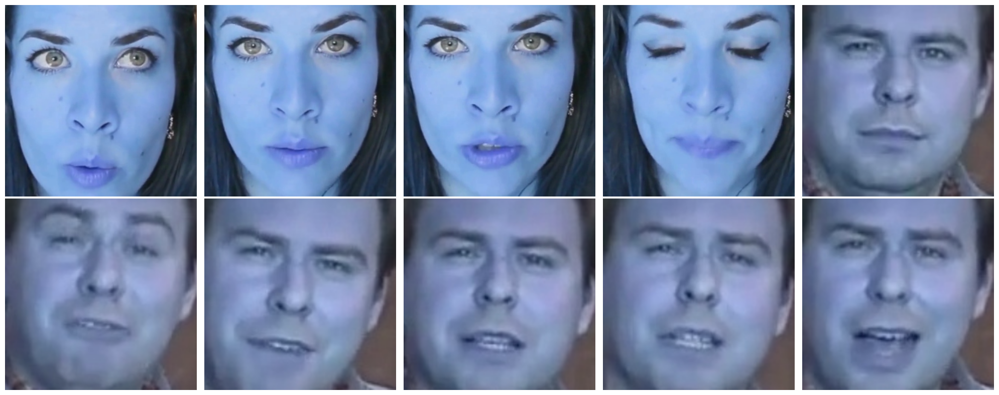

In [ ]:
import matplotlib.pyplot as plt

# Assuming D is a list or array of images each with shape (224, 224, 3)
# Here's how you can plot the first 10 images:

# Set up the plot with 2 rows and 5 columns to display the 10 images
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))

for i, ax in enumerate(axes.flatten()):
    # Get the i-th image from the dataset
    image = features_test[i]

    # Display the image
    ax.imshow(image)

    # Hide the axes
    ax.axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

array([[[45, 43, 49],
        [44, 42, 48],
        [42, 42, 48],
        ...,
        [71, 70, 80],
        [70, 69, 79],
        [70, 69, 79]],

       [[45, 43, 49],
        [44, 42, 48],
        [42, 42, 48],
        ...,
        [70, 69, 79],
        [70, 69, 79],
        [70, 68, 78]],

       [[44, 42, 48],
        [43, 42, 48],
        [42, 42, 48],
        ...,
        [69, 68, 78],
        [69, 68, 78],
        [69, 68, 78]],

       ...,

       [[59, 49, 65],
        [61, 51, 67],
        [64, 54, 70],
        ...,
        [95, 83, 79],
        [95, 83, 79],
        [95, 83, 79]],

       [[58, 48, 64],
        [60, 50, 66],
        [64, 54, 70],
        ...,
        [95, 83, 79],
        [95, 83, 79],
        [95, 83, 79]],

       [[58, 48, 64],
        [60, 50, 66],
        [64, 54, 70],
        ...,
        [95, 83, 79],
        [95, 83, 79],
        [95, 83, 79]]], dtype=uint8)
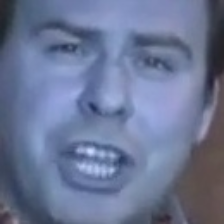

In [ ]:
features_test[12]

In [ ]:
misclassified_output1

[6,
 10,
 38,
 49,
 50,
 51,
 52,
 54,
 55,
 57,
 86,
 88,
 90,
 94,
 96,
 97,
 99,
 100,
 102,
 104,
 107,
 113,
 152,
 154,
 178,
 182,
 183,
 186,
 206,
 248,
 250,
 267,
 308,
 309,
 310,
 313,
 314,
 316,
 318,
 319,
 323,
 329,
 332,
 334,
 335,
 336,
 339,
 352,
 353,
 355,
 356,
 358,
 359,
 371,
 373,
 375,
 377,
 379,
 381,
 383,
 385,
 387,
 389,
 391,
 393,
 394,
 396,
 397,
 399,
 400,
 401,
 402,
 403,
 405,
 406,
 407,
 408,
 409,
 411,
 412,
 429,
 436,
 475,
 476,
 477,
 478,
 480,
 481,
 482,
 520,
 521,
 522,
 523,
 525,
 526,
 527,
 593,
 595,
 596,
 600,
 610,
 611,
 613,
 614,
 615,
 616,
 617,
 618,
 628,
 633,
 669,
 671,
 673,
 675,
 676,
 678,
 688,
 689,
 690,
 691,
 692,
 693,
 694,
 695,
 734,
 735,
 736,
 737,
 739,
 741,
 742,
 743,
 745,
 747,
 748,
 749,
 751,
 762,
 763,
 806,
 809,
 811,
 812,
 813,
 814,
 819,
 836,
 837,
 845,
 847,
 849,
 851,
 853,
 855,
 857,
 858,
 895,
 897,
 899,
 901,
 903,
 905,
 907,
 909,
 911,
 921,
 922,
 924,
 929,
 943

In [ ]:
misclassified

array([   0,    1,    3, ..., 3846, 3847, 3853])

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# Using a different segmentation algorithm
explainer = LimeImageExplainer()
explanation_image, explanation_mask = generate_textual_explanation(
    img_array=features_test[282],
    model=model,
    explainer=explainer,
    segmentation_method='slic',
    num_segments=100,  # Example segmentation parameter for slic
    compactness=10     # Another example segmentation parameter for slic
)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 643ms/step


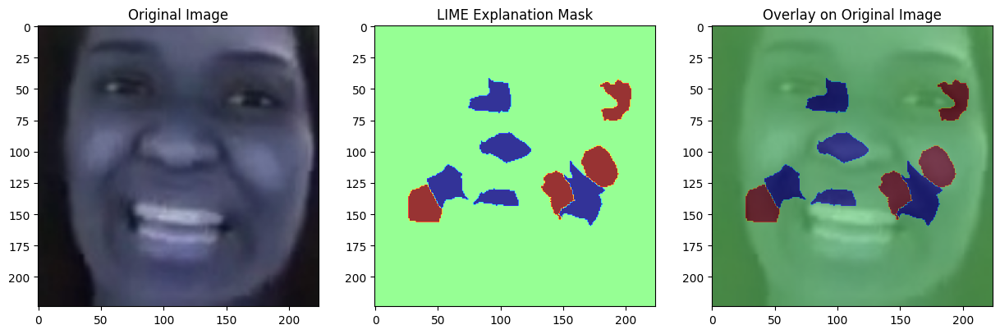

In [ ]:
# Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[282])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_mask, cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[282])
plt.imshow(explanation_mask, cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

In [ ]:
np_data_X[14000]
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(np_data_X[14000], model, explainer, segmentation_fn=segmentation_fn)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 424ms/step


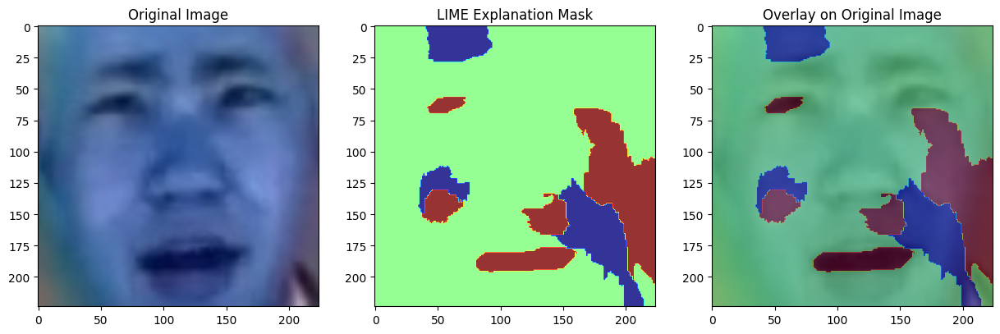

In [ ]:
# Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(np_data_X[14000])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(np_data_X[14000])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[21], model, explainer, segmentation_fn=segmentation_fn)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 465ms/step


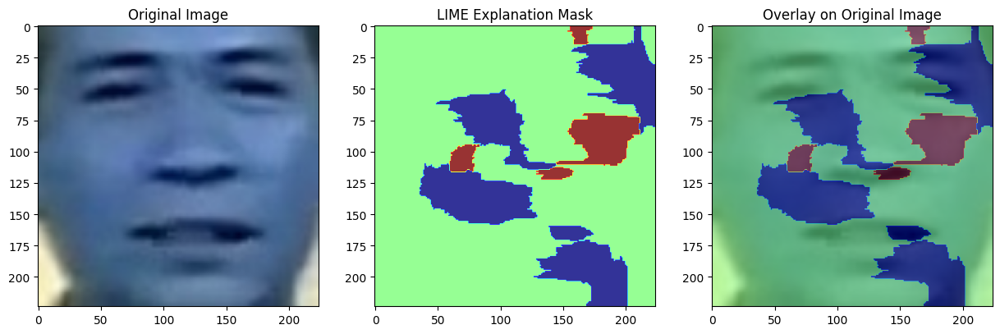

In [ ]:
# Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[21])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[21])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

Text(0.5, 1.0, 'Original Image')

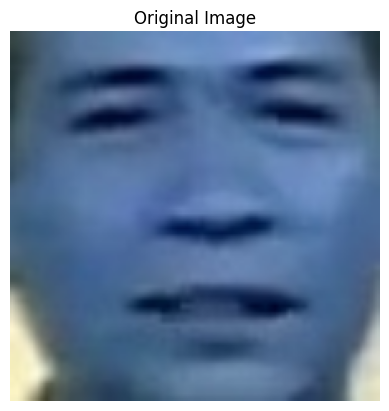

In [ ]:
# plt.figure(figsize=(15, 15))
# plt.subplot(1, 3, 1)
plt.axis('off')
plt.imshow(features_test[21])
plt.title("Original Image")

Text(0.5, 1.0, 'Original Image')

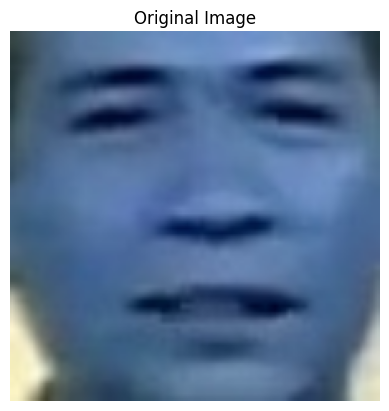

In [ ]:
plt.axis('off')
plt.imshow(features_test[21])
plt.title("Original Image")

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 338ms/step


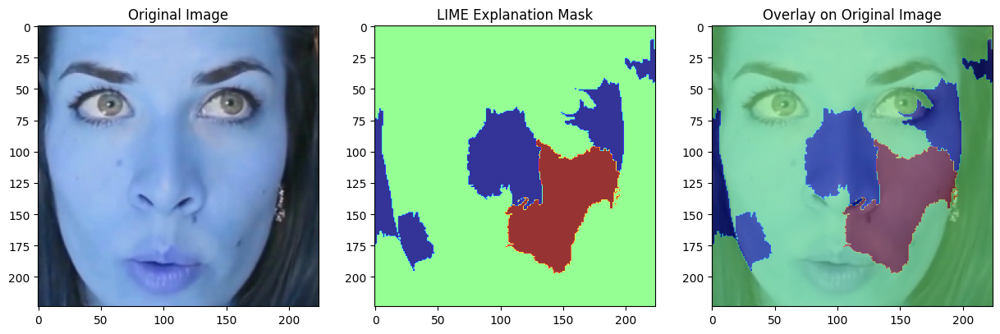

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[0], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[0])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[0])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 342ms/step


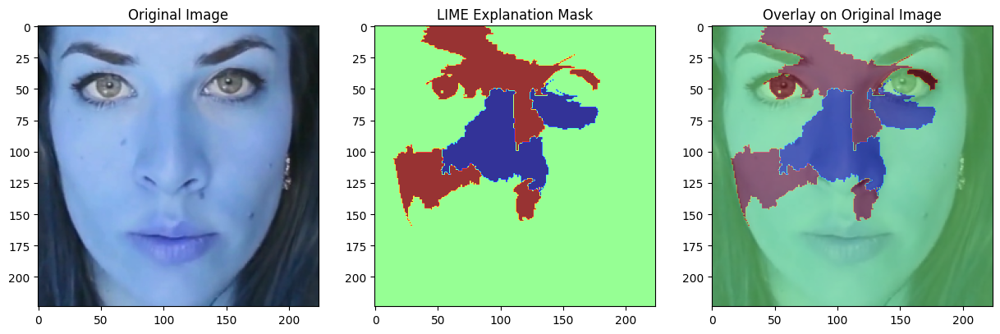

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[1], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[1])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[1])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 354ms/step


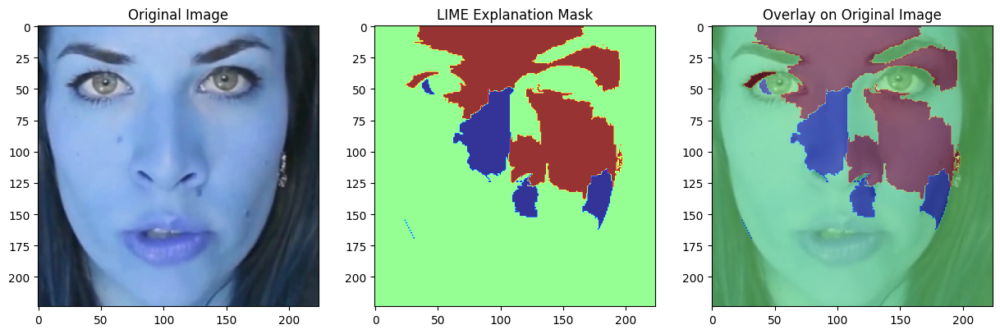

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[2], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[2])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[2])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 349ms/step


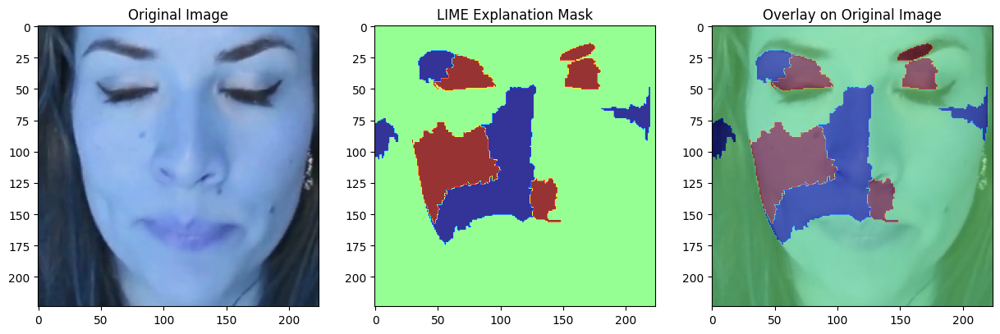

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[3], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[3])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[3])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 354ms/step


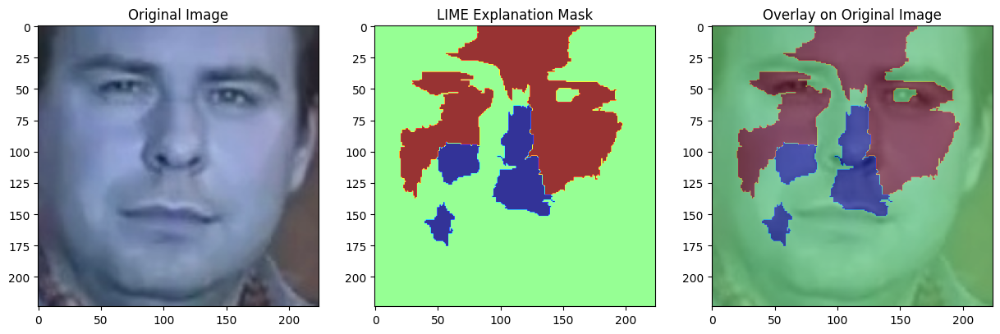

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[4], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[4])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[4])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 357ms/step


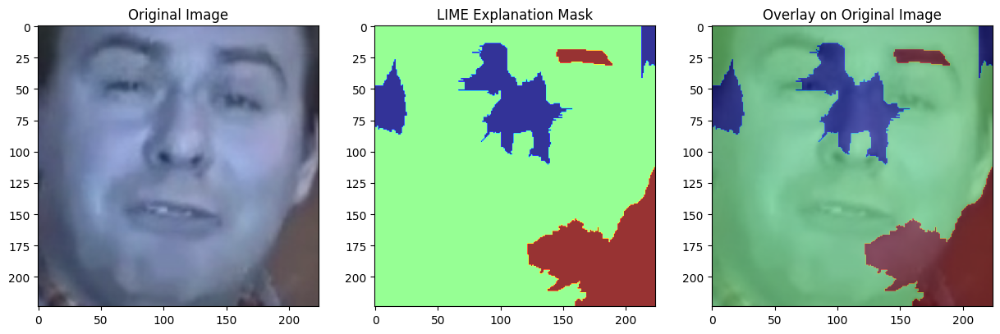

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[5], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[5])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[5])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 353ms/step


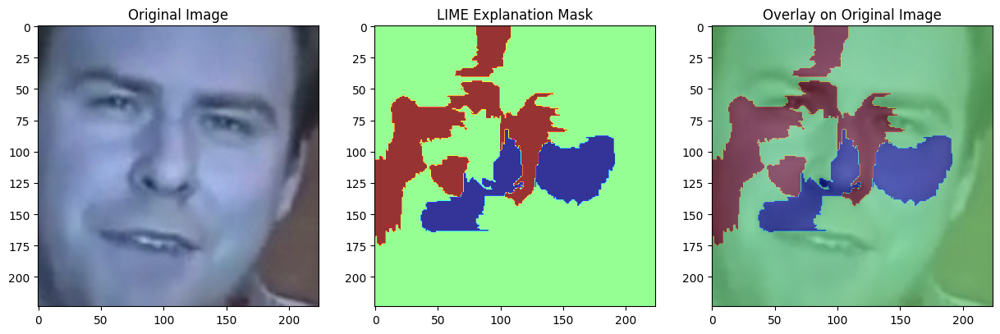

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[6], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[6])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[6])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 362ms/step


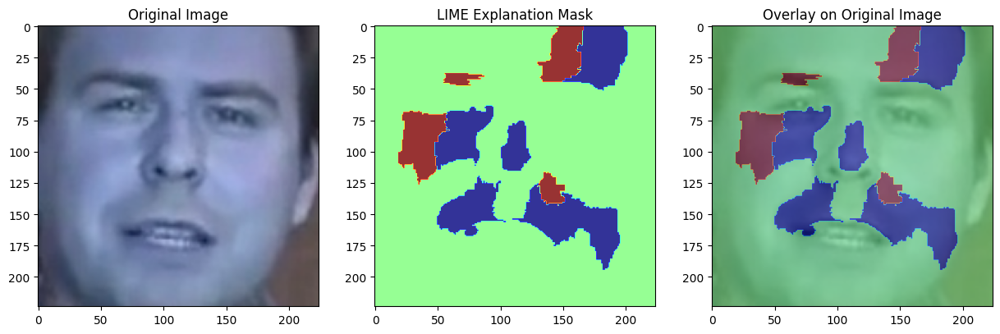

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[7], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[7])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[7])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 618ms/step


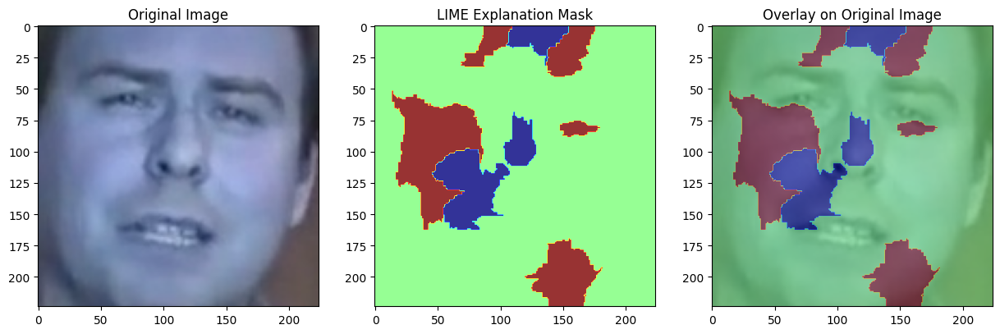

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[8], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[8])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[8])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 599ms/step


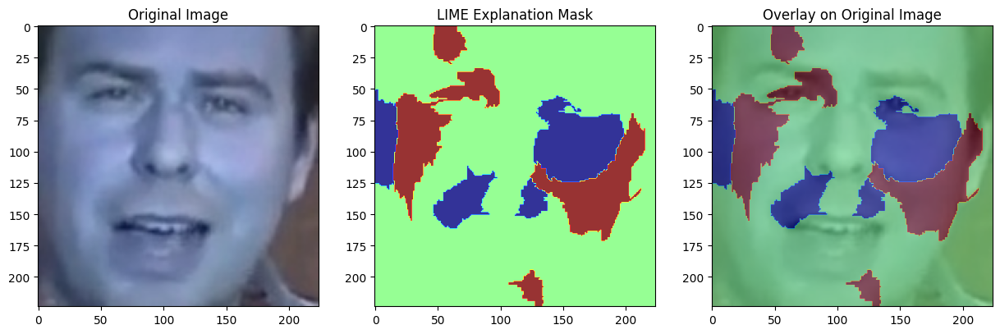

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[9], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[9])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[9])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 517ms/step


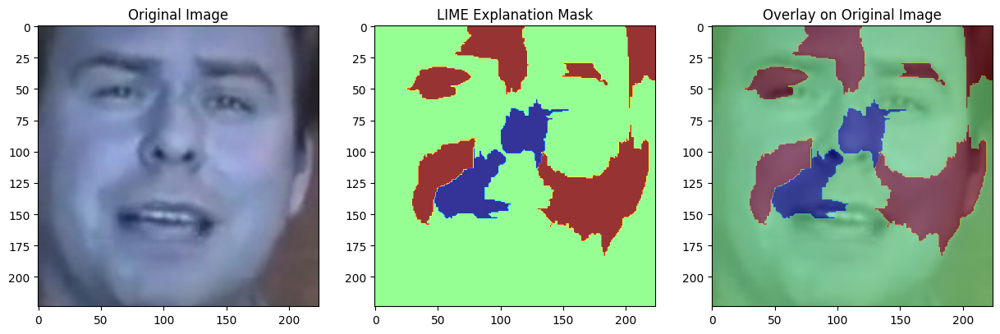

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[10], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[10])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[10])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 361ms/step


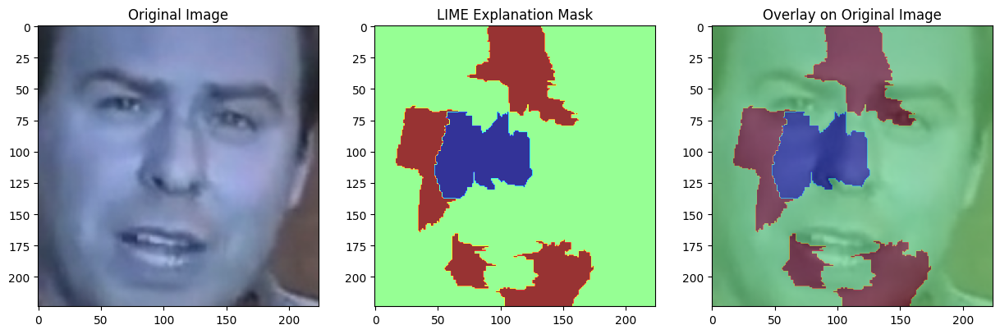

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[11], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[11])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[11])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# from skimage.segmentation import quickshift
# from lime.lime_image import LimeImageExplainer

# # Initialize the figure outside the loop
# plt.figure(figsize=(15, 45))  # Adjust the figure size as needed

# for i in range(0, 11):
#     # Using a different segmentation algorithm
#     segmentation_fn = quickshift
#     explainer = LimeImageExplainer()
#     explanation_text = generate_textual_explanation(features_test[i], model, explainer, segmentation_fn=segmentation_fn)

#     # Plot the original image
#     plt.subplot(11, 3, i * 3 + 1)
#     plt.imshow(features_test[i])
#     plt.title("Original Image")

#     # Plot the LIME explanation mask
#     plt.subplot(11, 3, i * 3 + 2)
#     plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
#     plt.title("LIME Explanation Mask")

#     # Plot the overlay of the mask on the image
#     plt.subplot(11, 3, i * 3 + 3)
#     plt.imshow(features_test[i])
#     plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
#     plt.title("Overlay on Original Image")

#     plt.show()  # This will print all the plots at once after the loop

In [ ]:
masks = []
for i in range(4,13):
      segmentation_fn = quickshift
      explainer = LimeImageExplainer()
      explanation_text = generate_textual_explanation(features_test[i], model, explainer, segmentation_fn=segmentation_fn)
      masks.append(explanation_text[1])

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 351ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 376ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 413ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 401ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 359ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 389ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 342ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 421ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 356ms/step


In [ ]:
masks = []
for i in range(4300,4309):
      segmentation_fn = quickshift
      explainer = LimeImageExplainer()
      explanation_text = generate_textual_explanation(features_test[i], model, explainer, segmentation_fn=segmentation_fn)
      masks.append(explanation_text[1])

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 394ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 383ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 385ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 370ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 427ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 372ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 380ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 406ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 372ms/step


In [ ]:
calculate_jaccard_index(masks)

0.19773511966100224

array([[[ 70,  63,  54],
        [ 68,  61,  52],
        [ 66,  62,  54],
        ...,
        [ 76,  89, 114],
        [ 70,  84, 107],
        [ 69,  82, 104]],

       [[ 70,  63,  54],
        [ 67,  61,  52],
        [ 66,  61,  54],
        ...,
        [ 75,  89, 113],
        [ 70,  84, 107],
        [ 68,  81, 103]],

       [[ 70,  63,  54],
        [ 67,  61,  52],
        [ 66,  61,  54],
        ...,
        [ 76,  89, 114],
        [ 70,  84, 107],
        [ 67,  80, 102]],

       ...,

       [[ 27,  25,  25],
        [ 27,  25,  25],
        [ 27,  25,  25],
        ...,
        [192, 172, 170],
        [194, 173, 171],
        [205, 184, 182]],

       [[ 27,  25,  25],
        [ 27,  25,  25],
        [ 27,  25,  25],
        ...,
        [196, 176, 173],
        [197, 176, 174],
        [207, 187, 184]],

       [[ 27,  25,  25],
        [ 27,  25,  25],
        [ 27,  25,  25],
        ...,
        [199, 179, 177],
        [200, 179, 177],
        [209, 190, 187]]], dtype=uint8)
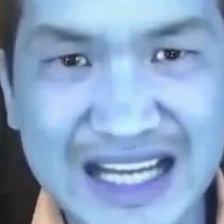

In [ ]:
# features_test[4300]

In [ ]:
def calculate_jaccard_index(masks):
    if not masks:
        return 1  # Return 1 if masks list is empty, indicating complete similarity

    jaccard_indices = []
    for i in range(len(masks)):
        for j in range(i + 1, len(masks)):
            intersection = np.logical_and(masks[i], masks[j]).sum()
            union = np.logical_or(masks[i], masks[j]).sum()
            jaccard_indices.append(intersection / union if union != 0 else 1)

    return np.mean(jaccard_indices)

In [ ]:
import numpy as np

def calculate_jaccard_index_window(masks, window_size=2):
    if not masks:
        return 1  # Return 1 if masks list is empty, indicating complete similarity

    num_masks = len(masks)
    jaccard_indices = []

    for i in range(num_masks):
        # Determine the window of indices to compare with
        start_index = max(i - window_size, 0)
        end_index = min(i + window_size + 1, num_masks)

        # Compute Jaccard index with masks in the window
        for j in range(start_index, end_index):
            if i != j:
                intersection = np.logical_and(masks[i], masks[j]).sum()
                union = np.logical_or(masks[i], masks[j]).sum()
                jaccard_indices.append(intersection / union if union != 0 else 1)

    return np.mean(jaccard_indices)


In [ ]:
jaccard_index = calculate_jaccard_index(masks)
print(jaccard_index)

0.17520166442742865


In [ ]:
labels_test[4500]

NameError: name 'labels_test' is not defined

array([[[11, 12, 16],
        [12, 13, 17],
        [11, 15, 16],
        ...,
        [18, 19, 29],
        [16, 16, 26],
        [14, 15, 25]],

       [[11, 12, 16],
        [11, 13, 16],
        [10, 13, 14],
        ...,
        [18, 19, 29],
        [15, 16, 27],
        [14, 15, 25]],

       [[12, 14, 15],
        [12, 14, 15],
        [11, 13, 14],
        ...,
        [18, 19, 29],
        [16, 17, 26],
        [14, 15, 25]],

       ...,

       [[25, 33, 55],
        [24, 32, 53],
        [23, 32, 52],
        ...,
        [23, 27, 45],
        [22, 26, 45],
        [21, 25, 43]],

       [[24, 33, 53],
        [24, 33, 53],
        [23, 32, 52],
        ...,
        [21, 25, 43],
        [23, 27, 45],
        [23, 27, 45]],

       [[24, 33, 53],
        [24, 33, 53],
        [23, 32, 52],
        ...,
        [20, 24, 42],
        [23, 27, 45],
        [24, 28, 46]]], dtype=uint8)
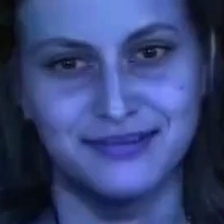

In [ ]:
features_test[4500]

In [ ]:
masks_real = []
for i in range(4500,4509):
      segmentation_fn = quickshift
      explainer = LimeImageExplainer()
      explanation_text = generate_textual_explanation(features_test[i], model, explainer, segmentation_fn=segmentation_fn)
      masks_real.append(explanation_text[1])

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 360ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 582ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 361ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 361ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 377ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 643ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 670ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 637ms/step


In [ ]:
jaccard_index_real = calculate_jaccard_index(masks_real)
print(jaccard_index_real)

0.20085150294504026


In [ ]:
4500,4509
4,13
2001,2009
4355,4364
4999,5007
5793,5801
502,510
993,1002
3192,3201
2496,2505

array([[[22, 10, 10],
        [22, 10, 10],
        [20,  9, 11],
        ...,
        [44, 44, 50],
        [45, 45, 51],
        [48, 48, 54]],

       [[22, 10, 10],
        [22, 10, 10],
        [20,  9, 11],
        ...,
        [45, 45, 51],
        [45, 45, 51],
        [47, 47, 53]],

       [[19,  9,  9],
        [19,  9,  9],
        [19,  8, 10],
        ...,
        [45, 45, 51],
        [45, 45, 51],
        [46, 46, 52]],

       ...,

       [[27, 24, 26],
        [29, 26, 28],
        [32, 29, 31],
        ...,
        [25, 24, 28],
        [25, 24, 28],
        [27, 26, 30]],

       [[28, 25, 27],
        [29, 26, 28],
        [32, 29, 31],
        ...,
        [25, 24, 28],
        [26, 25, 27],
        [27, 26, 28]],

       [[29, 26, 28],
        [30, 27, 29],
        [33, 30, 32],
        ...,
        [25, 24, 28],
        [26, 25, 27],
        [28, 27, 29]]], dtype=uint8)
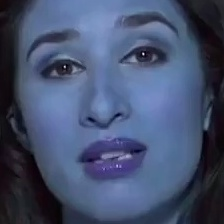

In [ ]:
features_test[2496]

In [ ]:
labels_test[2500]

0

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[2000], model, explainer, segmentation_fn=segmentation_fn)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 380ms/step


In [ ]:
# # Using a different segmentation algorithm
# segmentation_fn = quickshift
# explainer = LimeImageExplainer()
# explanation_text = generate_textual_explanation(features_test[2001], model, explainer, segmentation_fn=segmentation_fn)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 387ms/step


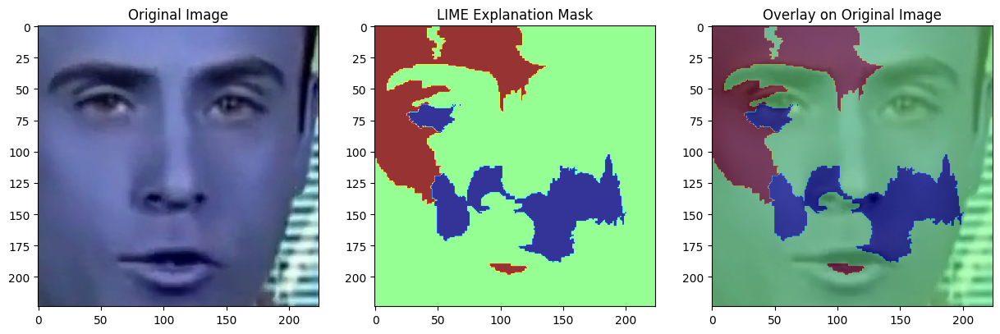

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[1995], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[1995])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[1995])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 369ms/step


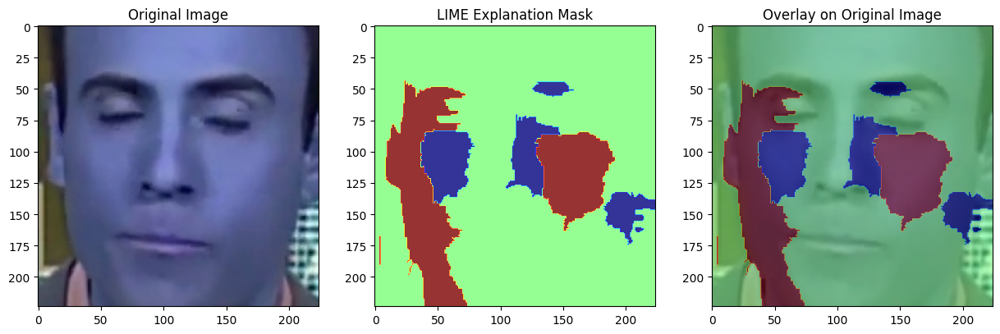

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[1996], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[1996])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[1996])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 408ms/step


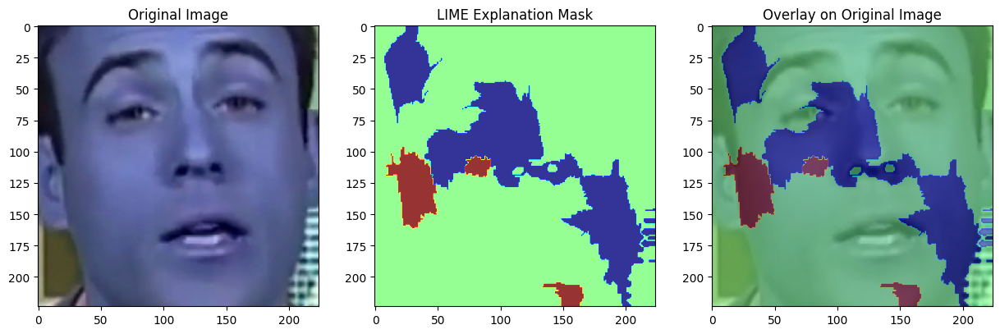

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[1997], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[1997])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[1997])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 391ms/step


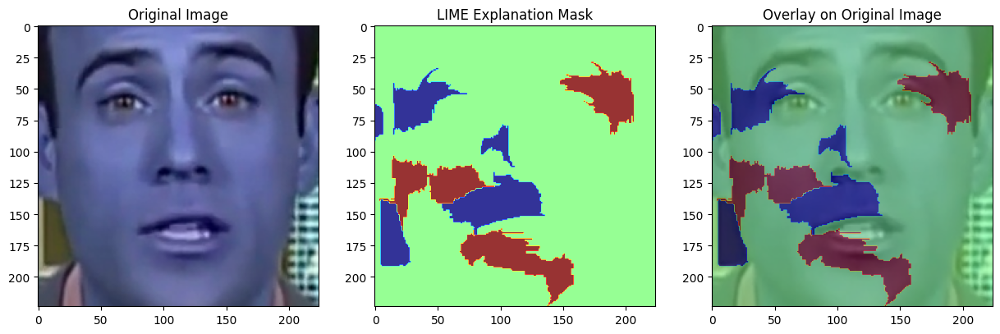

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[1998], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[1998])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[1998])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 411ms/step


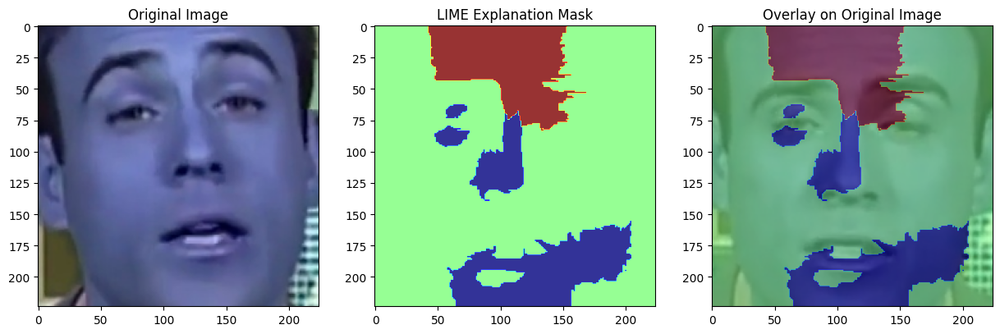

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[1999], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[1997])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[1999])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# for i in range(0,11):

      # Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[1999], model, explainer, segmentation_fn=segmentation_fn)

      # Plot the original image, the explanation mask, and the overlay of the mask on the image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
plt.imshow(features_test[1997])
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(explanation_text[1], cmap='jet', alpha=0.8)
plt.title("LIME Explanation Mask")

plt.subplot(1, 3, 3)
plt.imshow(features_test[1999])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")
plt.show()

In [ ]:
# Using a different segmentation algorithm
segmentation_fn = quickshift
explainer = LimeImageExplainer()
explanation_text = generate_textual_explanation(features_test[2001], model, explainer, segmentation_fn=segmentation_fn)

In [ ]:
np_data_X[6996:7005]

array([[[[ 79,  73,  72],
         [ 73,  70,  70],
         [ 61,  63,  66],
         ...,
         [ 30,  41,  55],
         [ 31,  40,  54],
         [ 30,  39,  53]],

        [[ 79,  73,  75],
         [ 73,  71,  72],
         [ 62,  64,  68],
         ...,
         [ 31,  40,  54],
         [ 29,  38,  52],
         [ 27,  36,  50]],

        [[ 79,  75,  77],
         [ 71,  71,  74],
         [ 62,  65,  70],
         ...,
         [ 31,  41,  55],
         [ 31,  38,  52],
         [ 29,  37,  50]],

        ...,

        [[ 35,  49,  71],
         [ 31,  48,  69],
         [ 28,  47,  68],
         ...,
         [ 31,  55,  73],
         [ 37,  59,  77],
         [ 36,  55,  76]],

        [[ 35,  49,  68],
         [ 31,  47,  66],
         [ 28,  47,  65],
         ...,
         [ 33,  57,  76],
         [ 37,  58,  79],
         [ 35,  54,  75]],

        [[ 34,  47,  65],
         [ 32,  47,  64],
         [ 30,  50,  66],
         ...,
         [ 30,  54,  74],
        

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# Using a different segmentation algorithm
segmentation_fn = quickshift

masks = []
for i in range(6996,7005):
      segmentation_fn = quickshift
      explainer = LimeImageExplainer()
      explanation_text = generate_textual_explanation(np_data_X[i], model, explainer, segmentation_fn=segmentation_fn)
      masks.append(explanation_text[1])

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 694ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 422ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 416ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 387ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 649ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 591ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 506ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 390ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 421ms/step


In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# Using a different segmentation algorithm
segmentation_fn = quickshift

lime_masks = []
for i in range(6996,7005):
      segmentation_fn = quickshift
      explainer = LimeImageExplainer()
      explanation_text = generate_textual_explanation(np_data_X[i], model, explainer, segmentation_fn=segmentation_fn)
      lime_masks.append(explanation_text[1])

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 426ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 759ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 400ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 455ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 416ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 438ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 423ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 687ms/step


In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# Using a different segmentation algorithm
segmentation_fn = quickshift

lime_masks_fake = []
for i in range(10099,7005):
      segmentation_fn = quickshift
      explainer = LimeImageExplainer()
      explanation_text = generate_textual_explanation(np_data_X[i], model, explainer, segmentation_fn=segmentation_fn)
      lime_masks_real.append(explanation_text[1])

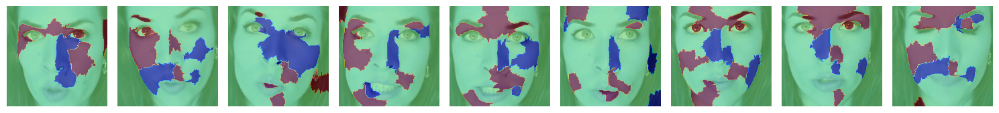

In [ ]:
fig, axs = plt.subplots(1, 9, figsize=(15, 17))  # 10 rows, 9 columns
j = 0
# Loop through and plot each image
for i, ax in enumerate(axs.flatten()):
    ax.imshow(np_data_X[j+6996])
    ax.imshow(lime_masks[j], cmap='jet', alpha=0.5)
    ax.axis('off')  # Hide axes
    j=j+1

plt.tight_layout()
plt.show()

In [ ]:
jaccard_index = calculate_jaccard_index(masks)
print(jaccard_index)

In [ ]:
jaccard_index = calculate_jaccard_index(masks)
print(jaccard_index)

0.2437887037983738


Exception ignored in: <function _xla_gc_callback at 0x7b099badb1c0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 97, in _xla_gc_callback
KeyboardInterrupt: 


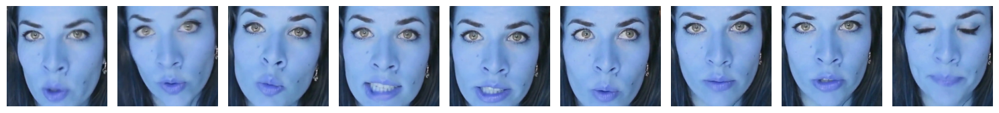

In [ ]:
fig, axs = plt.subplots(1, 9, figsize=(15, 17))  # 10 rows, 9 columns
j = 0
# Loop through and plot each image
for i, ax in enumerate(axs.flatten()):
    ax.imshow(np_data_X[j+6996])
    ax.axis('off')  # Hide axes
    j=j+1
    if j==63:
      j=j+1

plt.tight_layout()
plt.show()

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# Using a different segmentation algorithm
segmentation_fn = quickshift
masks_for_all_real = []

for j in range(0,10):
    masks = []
    for i in range(t[j][0],t[j][1]):
          segmentation_fn = quickshift
          explainer = LimeImageExplainer()
          explanation_text = generate_textual_explanation(np_data_X[i], model, explainer, segmentation_fn=segmentation_fn)
          masks.append(explanation_text[1])
    masks_for_all_real.append(masks)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 660ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 383ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 386ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 391ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 408ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 420ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 399ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 634ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 500ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 410ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 715ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 440ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 395ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 434ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 400ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 409ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 410ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 739ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 436ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 424ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 417ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 708ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 408ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 620ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 414ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 679ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 663ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 402ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 422ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 390ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 665ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 428ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 424ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 610ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 401ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 418ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 376ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 655ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 610ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 396ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 405ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 410ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 449ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 376ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 395ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 639ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 389ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 390ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 547ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 416ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 659ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 430ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 421ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 397ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 419ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 387ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 426ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 414ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 401ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 405ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 387ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 427ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 421ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 676ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 413ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 716ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 403ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 415ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 414ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 386ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 384ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 589ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 412ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 431ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 420ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 396ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 721ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 421ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 396ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 387ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 386ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 378ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 667ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 385ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 385ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 597ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 436ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 719ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 407ms/step


In [ ]:
t = [[6996,7005],
[7005,7014],
[7014,7023],
[7023,7032],
[7032,7041],
[7041,7050],
[7050,7059],
[7060,7069],
[7069,7078],
[7079,7087]]

In [ ]:
jaccard_index_all_real = []
for i in range(0,10):
  jaccard_index_real = calculate_jaccard_index(masks_for_all[i])
  jaccard_index_all_real.append(jaccard_index_real)

In [ ]:
np.mean(jaccard_index_all_real)

0.21656197600699195

In [ ]:
np.median(jaccard_index_all_real)

0.20231632603250185

AttributeError: module 'numpy' has no attribute 'mode'

In [ ]:
for i in range(0,10):
      jaccard_index = calculate_jaccard_index(masks)
      print(jaccard_index)


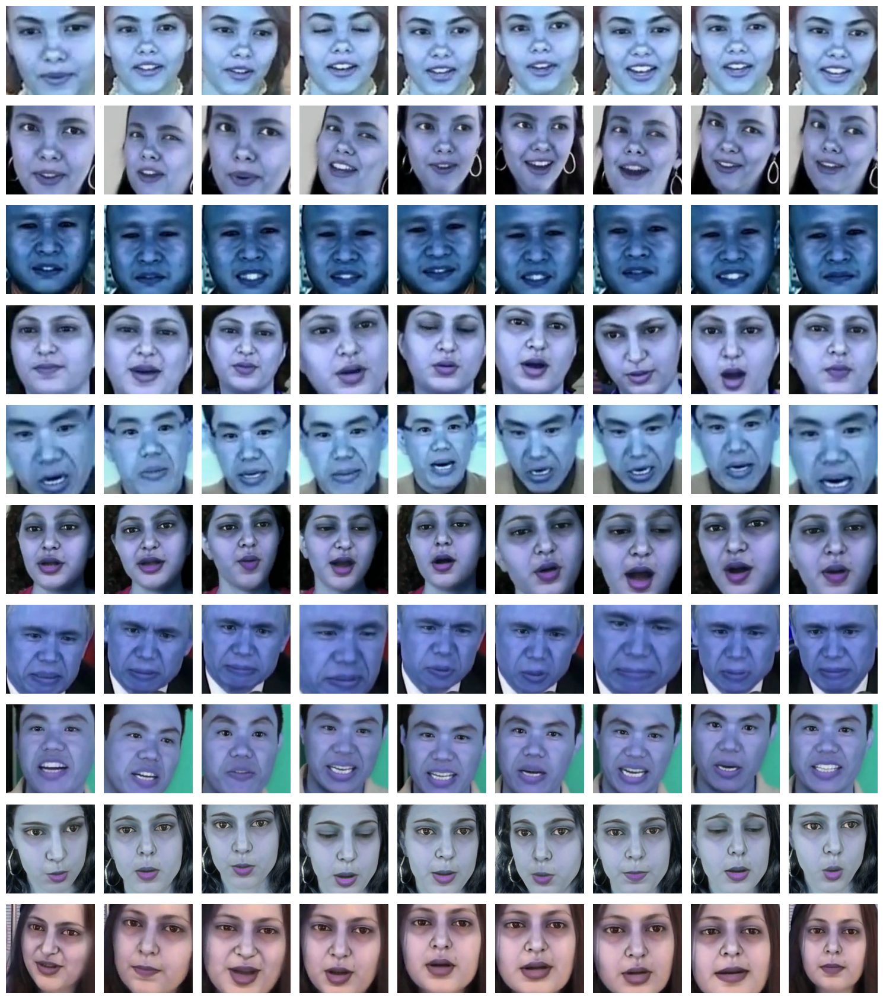

In [ ]:
fig, axs = plt.subplots(1, 9, figsize=(15, 17))  # 10 rows, 9 columns
j = 0
# Loop through and plot each image
for i, ax in enumerate(axs.flatten()):
    ax.imshow(np_data_X[j+10018])
    ax.axis('off')  # Hide axes
    j=j+1

plt.tight_layout()
plt.show()

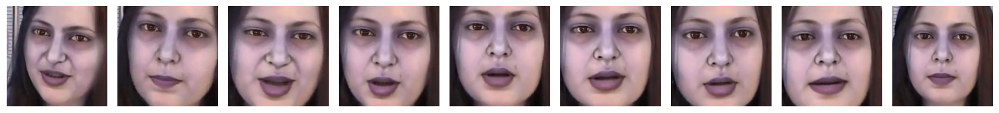

In [ ]:
fig, axs = plt.subplots(1, 9, figsize=(15, 17))  # 10 rows, 9 columns
j = 0
# Loop through and plot each image
for i, ax in enumerate(axs.flatten()):
    ax.imshow(np_data_X[j+10099])
    ax.imshow(explanation_text[j], cmap='jet', alpha=0.5)
    ax.axis('off')  # Hide axes
    j=j+1

plt.tight_layout()
plt.show()

In [ ]:
plt.subplot(1, 3, 3)
plt.imshow(features_test[4])
plt.imshow(explanation_text[1], cmap='jet', alpha=0.5)  # Overlay the mask with some transparency
plt.title("Overlay on Original Image")

array([[[ 85,  82,  98],
        [ 86,  83,  99],
        [ 90,  89, 105],
        ...,
        [ 89,  92, 106],
        [ 90,  93, 107],
        [ 90,  93, 107]],

       [[ 84,  82,  98],
        [ 86,  83,  99],
        [ 90,  88, 104],
        ...,
        [ 89,  92, 106],
        [ 90,  93, 107],
        [ 90,  93, 107]],

       [[ 83,  80,  96],
        [ 85,  82,  98],
        [ 90,  88, 104],
        ...,
        [ 89,  92, 106],
        [ 90,  93, 107],
        [ 90,  93, 107]],

       ...,

       [[172, 157, 145],
        [169, 154, 142],
        [158, 143, 131],
        ...,
        [142, 168, 175],
        [148, 173, 180],
        [150, 174, 182]],

       [[190, 174, 162],
        [187, 172, 160],
        [178, 162, 150],
        ...,
        [143, 169, 176],
        [150, 176, 183],
        [151, 177, 184]],

       [[195, 179, 167],
        [192, 176, 164],
        [183, 167, 155],
        ...,
        [144, 170, 177],
        [150, 176, 183],
        [152, 178, 185]]], dtype=uint8)
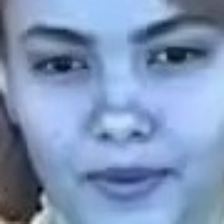

In [ ]:
np_data_X[10018]

In [ ]:
###################FAKES #########################
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# Using a different segmentation algorithm
segmentation_fn = quickshift
masks_for_all_fake = []
k = 0
for j in range(0,10):
    masks = []
    for i in range(0,9):
          segmentation_fn = quickshift
          explainer = LimeImageExplainer()
          explanation_text = generate_textual_explanation(np_data_X[k + 10018], model, explainer, segmentation_fn=segmentation_fn)
          masks.append(explanation_text[1])
          k=k+1
    masks_for_all_fake.append(masks)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 411ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 424ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 429ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 546ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 400ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 426ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 390ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 421ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 688ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 721ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 434ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 379ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 380ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 426ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 434ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 898ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 399ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 420ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 427ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 681ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 409ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 450ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 409ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 722ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 431ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 438ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 407ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 731ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 399ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 409ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 389ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 397ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 396ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 426ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 418ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 426ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 434ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 409ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 388ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 421ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 411ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 410ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 421ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 413ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 416ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 721ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 416ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 386ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 594ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 407ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 398ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 567ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 410ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 400ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 440ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 439ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 417ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 615ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 618ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 413ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 415ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 629ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 400ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 406ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 413ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 629ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 398ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 414ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 652ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 442ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 425ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 742ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 433ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 431ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 629ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 423ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - ETA: 0s

In [ ]:
# masks_for_all_fake

In [ ]:
jaccard_index_all_fake = []
for i in range(0,10):
  jaccard_index_fake = calculate_jaccard_index(masks_for_all_fake[i])
  jaccard_index_all_fake.append(jaccard_index_fake)

In [ ]:
jaccard_index_all_fake

[0.2858581812498972,
 0.18309981159312277,
 0.2273490210421083,
 0.1516911063274519,
 0.24003682263839624,
 0.13584842435300643,
 0.20737559847930012,
 0.2233354745628581,
 0.16977407714211515,
 0.17028005198205992]

In [ ]:
np.mean(jaccard_index_all_fake)

0.19946485693703161

In [ ]:
np.median(jaccard_index_all_fake)

0.19523770503621146

In [ ]:
from skimage.segmentation import quickshift
from lime.lime_image import LimeImageExplainer

# Using a different segmentation algorithm
segmentation_fn = quickshift

lime_masks_fake = []
for i in range(0,10):
      segmentation_fn = quickshift
      explainer = LimeImageExplainer()
      explanation_text = generate_textual_explanation(np_data_X[i+10099], model, explainer, segmentation_fn=segmentation_fn)
      lime_masks_fake.append(explanation_text[1])

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 423ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 678ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 472ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 507ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 427ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 423ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 690ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 441ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 431ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 719ms/step


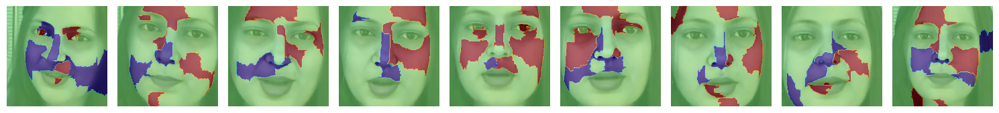

In [ ]:
fig, axs = plt.subplots(1, 9, figsize=(15, 17))  # 10 rows, 9 columns
j = 0
# Loop through and plot each image
for i, ax in enumerate(axs.flatten()):
    ax.imshow(np_data_X[j+10099])
    ax.imshow(lime_masks_fake[j], cmap='jet', alpha=0.5)
    ax.axis('off')  # Hide axes
    j=j+1

plt.tight_layout()
plt.show()